# Datashader with Dask

Using Uber/Lyft NYC data preprocessed by Matt.

In [1]:
import coiled
import dask.dataframe as dd
import matplotlib.pyplot as plt

In [2]:
cluster = coiled.Cluster(
    name="datashader",
    n_workers=15, 
    package_sync=True
)

╭───────────────────────────────────────── Package Issues ─────────────────────────────────────────╮
│                      ╷                                                          ╷                │
│   Package            │ Issue                                                    │ Risk Level     │
│ ╶────────────────────┼──────────────────────────────────────────────────────────┼──────────────╴ │
│   libgfortran5       │ 11.3.0 has no install candidate for linux-64             │                │
│   libgfortran        │ 5.0.0 has no install candidate for linux-64              │                │
│   grpcio             │ 1.46.3 has no install candidate for linux-64             │                │
│   grpc-cpp           │ 1.46.3 has no install candidate for linux-64             │                │
│   arrow-cpp          │ 8.0.0 has no install candidate for linux-64              │                │
│   openssl            │ Package ignored                                          │                │
│   coiled-runtime     │ Package ignored                                          │                │
│   abseil-cpp         │ Package ignored                                          │                │
│                      ╵                                                          ╵                │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯

Output()

In [3]:
from distributed import Client
client = Client(cluster)

/Users/rpelgrim/mambaforge/envs/datashader/lib/python3.10/site-packages/distributed/client.py:1274: VersionMismatchWarning: Mismatched versions found

+---------+--------+-----------+---------+
| Package | client | scheduler | workers |
+---------+--------+-----------+---------+
| lz4     | 4.0.0  | 4.0.2     | 4.0.2   |
+---------+--------+-----------+---------+
  warnings.warn(version_module.VersionMismatchWarning(msg[0]["warning"]))


In [4]:
client

<Client: 'tls://10.0.11.131:8786' processes=12 threads=48, memory=179.15 GiB>

In [8]:
ddf = dd.read_parquet(
    "s3://coiled-datasets/dask-book/nyc-tlc/2009"
)

In [9]:
ddf.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount
0,VTS,2009-01-04 02:52:00,2009-01-04 03:02:00,1,2.63,-73.991957,40.721567,NaN,None,-73.993803,40.695922,CASH,8.9,0.5,NaN,0.00,0.0,9.40
1,VTS,2009-01-04 03:31:00,2009-01-04 03:38:00,3,4.55,-73.982102,40.736290,NaN,None,-73.955850,40.768030,Credit,12.1,0.5,NaN,2.00,0.0,14.60
2,VTS,2009-01-03 15:43:00,2009-01-03 15:57:00,5,10.35,-74.002587,40.739748,NaN,None,-73.869983,40.770225,Credit,23.7,0.0,NaN,4.74,0.0,28.44
3,DDS,2009-01-01 20:52:58,2009-01-01 21:14:00,1,5.00,-73.974267,40.790955,NaN,None,-73.996558,40.731849,CREDIT,14.9,0.5,NaN,3.05,0.0,18.45
4,DDS,2009-01-24 16:18:23,2009-01-24 16:24:56,1,0.40,-74.001580,40.719382,NaN,None,-74.008378,40.720350,CASH,3.7,0.0,NaN,0.00,0.0,3.70


In [13]:
# ddf2 = dd.read_parquet(
#     "s3://coiled-datasets/mrocklin/nyc-taxi"
# )

# Visualizing Million-Point Datasets

## Visualize the Data to Get Insights
Having done your due diligence and ensured the dataset is clean, you're now eager to visualise the data and hopefully get some meaningful insights that will help your organisation along. 

### Basic Matplotlib Plots
You want to plot some graphs to get a sense of the patterns in the dataset. Let's start with a very straightforward example: is there a relationship between trip_distance and fare_amount?

Having worked in pandas for years, you're comfortable using matplotlib and write the code below to create a scatter plot of the two columns.

In [14]:
ddf.plot(x="trip_distance", y="tip_amount", kind="scatter")

AttributeError: 'DataFrame' object has no attribute 'plot'

Dask does not support the straightforward .plot() functionality you're used to because Dask DataFrames typically contain million- or billion-point datasets. Visualizing all of these points on a single matplotlib graph does not produce meaningful graphics due to extreme overlay of datapoints.

Let's take a little detour to illustrate this point and drive it home.

We'll subset the Dask DataFrame to load just 0.1% of the data into a pandas DataFrame.

In [15]:
# subset 0.1% of the dataset
frac = 0.001
subset = ddf.sample(frac=frac).compute()

In [16]:
len(subset)

170801

This DataFrame contains over 170K data points.

Let's plot this on a normal, static matplotlib plot:

/Users/rpelgrim/mambaforge/envs/datashader/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<AxesSubplot: xlabel='trip_distance', ylabel='fare_amount'>

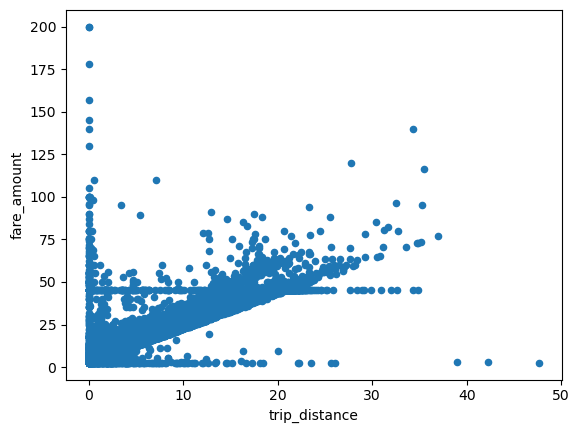

In [17]:
subset.plot(x="trip_distance", y="fare_amount", kind="scatter")

Or a little more involved to get a better formatted image:

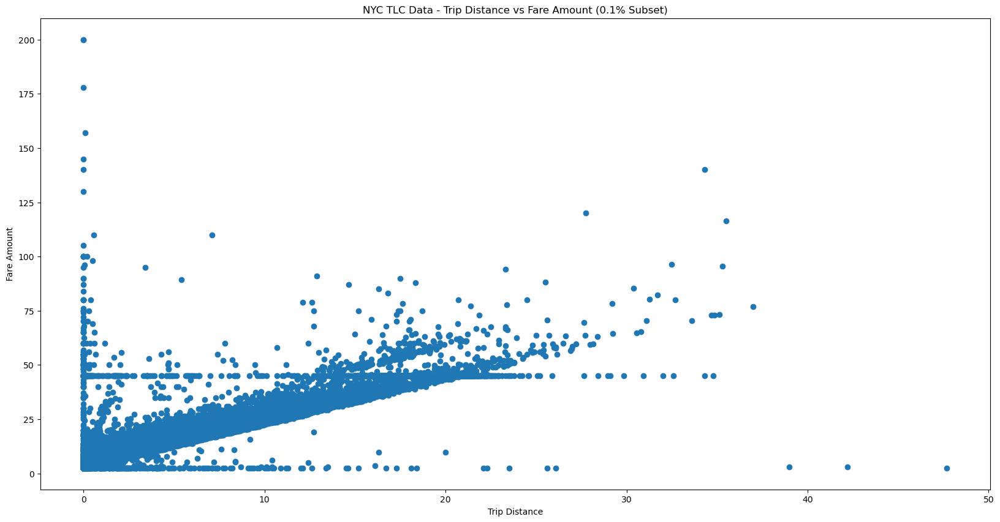

In [18]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=[20, 10])
plt.scatter(
    subset["trip_distance"],
    subset["fare_amount"],
)
plt.title(f"NYC TLC Data - Trip Distance vs Fare Amount ({frac*100}% Subset)")
plt.xlabel("Trip Distance")
plt.ylabel("Fare Amount")
plt.show()

The problem is pretty obvious: with this many data points it becomes impossible to distinguish individual data points when the density increases. There are literally hundreds of thousands of data points crammed into that bottom left corner. How many trips had a trip_distance of 20 miles and a fare_amount of 70? We simply can't tell from looking at this plot. 

And remember that this is only 0.1% of the dataset - there are 865 million more data points you would need to put on this graph to be complete!

You have two options here:
1. If you want to stick to using matplotlib or other standard plotting libraries, you'll have to reduce the number of data points even further. 
2. You can use DataShader to plot the entire dataset

### Plot Million-Point Datasets with DataShader
Datashader is an open-source Python library (part of the hvplot ecosystem) that was specifically developed for plotting million- and billion-point datasets. Rather than plotting a single point for each datapoint (which, as we have seen, quickly becomes unintelligble at this scale) Datashader instead uses a histogram method to create a color gradient that indicates the number of data points located on the same pixel. Generally speaking, darker pixels indicated less data points and lighter pixels indicate locations with higher density of data points.

For example, here's a datashader plot of all 300 million people in the US based on the 2010 census:

![title](images/usa_census.jpeg)

Fun fact: Datashader was built to work directly with Dask DataFrames.

#### Basic Datashader (Static)

Now that you've discovered Datashader, you're excited to try it out on your 868 million NYC TLC data points.

You import datashader, 

**NOTES**:
- datashader can't handle UInt8 and float16 it seems
- NEED TO CONVERT LOCATION DATA TO WEB MERCATOR!

### Undersampling Bokeh Plot

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
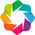

In [19]:
import holoviews as hv
import numpy as np
from holoviews import opts
from holoviews.element.tiles import StamenTonerBackgroundRetina

hv.extension("bokeh")

In [20]:
plot_width = int(750)
plot_height = int(plot_width // 1.2)
x_range, y_range = (-74.1, -73.7), (40.6, 40.9)
plot_options = hv.Options(width=plot_width, height=plot_height, xaxis=None, yaxis=None)

In [21]:
opts.defaults(
    opts.Points(width=plot_width, height=plot_height, size=5, color="blue"),
    opts.Overlay(width=plot_width, height=plot_height, xaxis=None, yaxis=None),
    opts.RGB(width=plot_width, height=plot_height),
)

In [22]:
samples_10k = ddf.sample(frac=0.00001).compute()
samples_1k = samples_10k.sample(n=1000)

In [23]:
len(samples_1k)

1000

In [24]:
tiles = StamenTonerBackgroundRetina().redim.range(x=x_range, y=y_range)
points = hv.Points(samples_1k, ["dropoff_longitude", "dropoff_latitude"])
tiles * points

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [dropoff_longitude,dropoff_latitude]   (vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,payment_type,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount)

This lets us distinguish individual data points. But we are working with just over 0.0001% of the dataset. Not really a meaningful subset in any way.

### Undersampling: 10,000 data points (0.001%)

In [28]:
samples = ddf.sample(frac=0.00001).compute()
tiles = StamenTonerBackgroundRetina().redim.range(x=x_range, y=y_range)
points = hv.Points(samples, ["dropoff_longitude", "dropoff_latitude"])
(tiles * points)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [dropoff_longitude,dropoff_latitude]   (vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,payment_type,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount)

This is just .001 percent of the dataset. This means you are missing 99.999% of the datapoints (!)

Not acceptable.

### Plot all datapoints with Datashader

In [29]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Greys9, Hot

Greys9_r = list(reversed(Greys9))[:-2]

In [30]:
%%time
cvs = ds.Canvas(
    plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range
)
agg = cvs.points(
    ddf, "dropoff_longitude", "dropoff_latitude", ds.count("passenger_count")
)
img = tf.shade(agg, cmap=["white", "darkblue"], how="linear")

CPU times: user 911 ms, sys: 150 ms, total: 1.06 s
Wall time: 40.5 s


Takes 40seconds with a 15-worker default cluster.

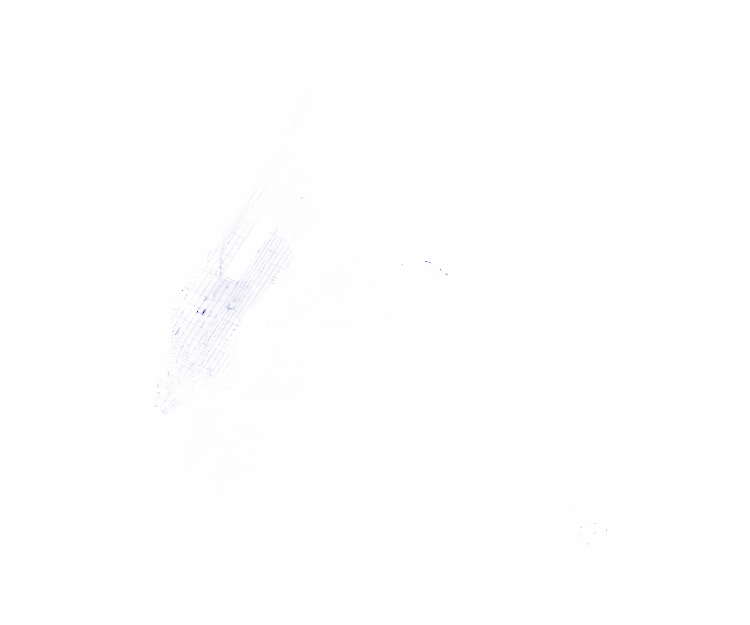

In [31]:
img

Non-linear scaling:

In [34]:
img2 = tf.shade(agg, cmap=Greys9_r, how="log")

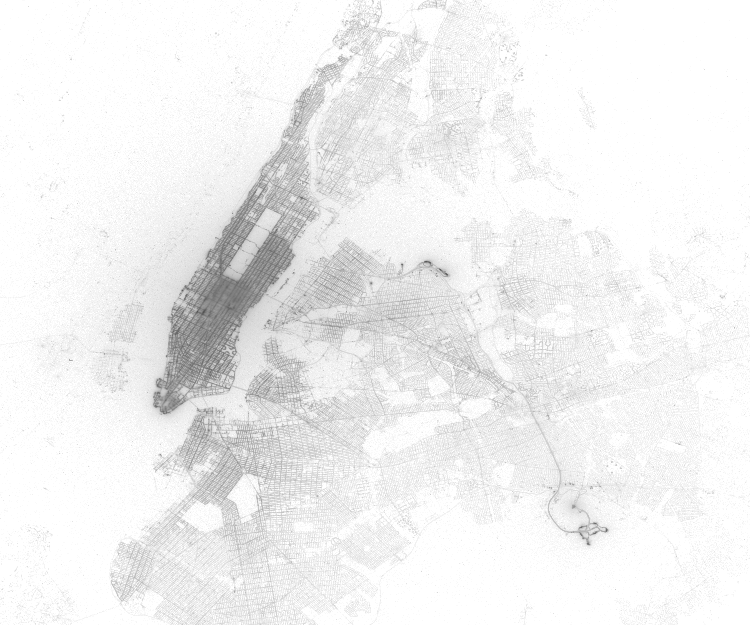

In [35]:
img2

**note to self**: Interesting, it looks like creating the `agg` object is what takes the biggest chunk of time here. After that, creating subsequent images is almost instant. I wonder if persisting `ddf` before creating the `agg` object would make this even faster.

CPU times: user 60.2 ms, sys: 6.43 ms, total: 66.6 ms
Wall time: 65.1 ms


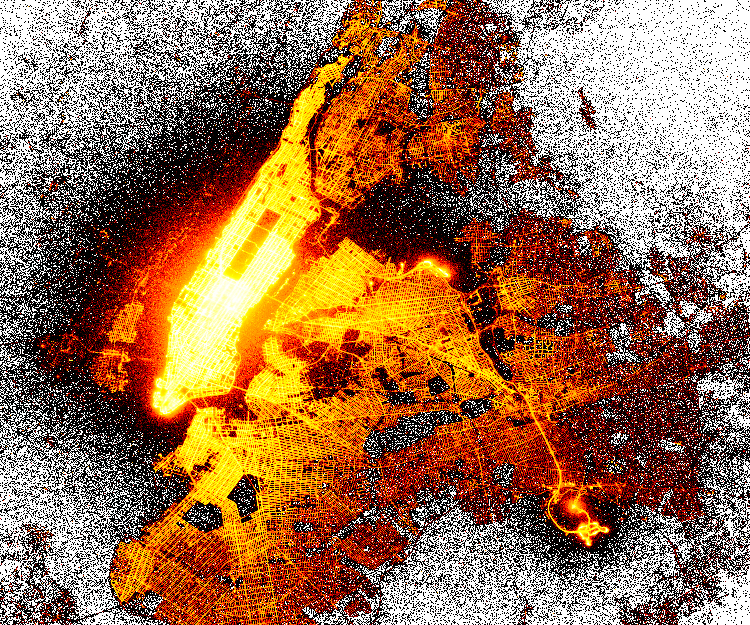

In [36]:
%%time
img3 = tf.shade(agg, cmap=Hot, how="eq_hist")
img3